In [3]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense , Conv2D , BatchNormalization , ReLU , Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB5
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils import class_weight
import tensorflow as tf
import logging
from sklearn.metrics import precision_score, recall_score, f1_score
from astropy.io import fits
from astropy.visualization import ImageNormalize, MinMaxInterval, LogStretch
from sklearn.metrics import confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

Fit file path to access the data with its header units 

In [ ]:
# Load the FITS image
fits_file = r"F:\more code\Real Streaks\sci\2018\0925\408576\ztf_20180925408576_000651_zr_c11_o_q1_sciimg.fits"  # Replace with your FITS file path
with fits.open(fits_file) as hdul:
    data = hdul[0].data 

# Check if data is loaded correctly
if data is None:
    raise ValueError("No data found in the FITS file.")


Checks the fit file is uploading or not 

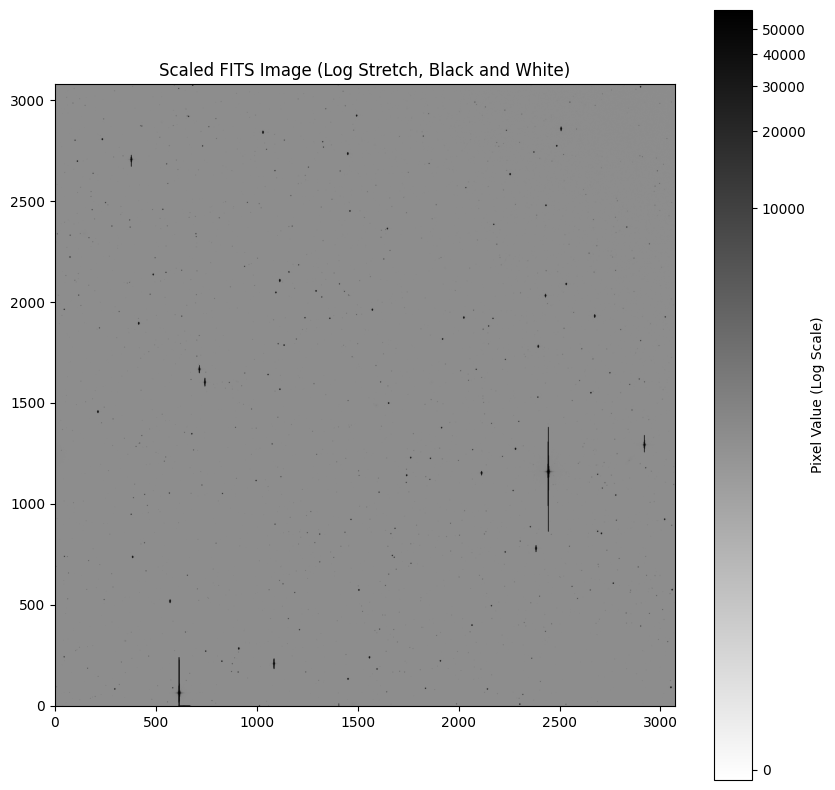

In [ ]:
# Check if data is loaded correctly
if data is None:
    raise ValueError("No data found in the FITS file.")

# Normalize the image for visualization using Log Stretch
norm = ImageNormalize(data, interval=MinMaxInterval(), stretch=LogStretch())
plt.figure(figsize=(10, 10))
plt.imshow(data, norm=norm, origin='lower', cmap='binary')  
plt.colorbar(label='Pixel Value (Log Scale)')
plt.title('Scaled FITS Image (Log Stretch, Black and White)')
plt.show()
plt.show()

This part deivides the fit image into 128x128 pixel images for testing and calculates the number of thumbnails in dimensions and save it to the output dir

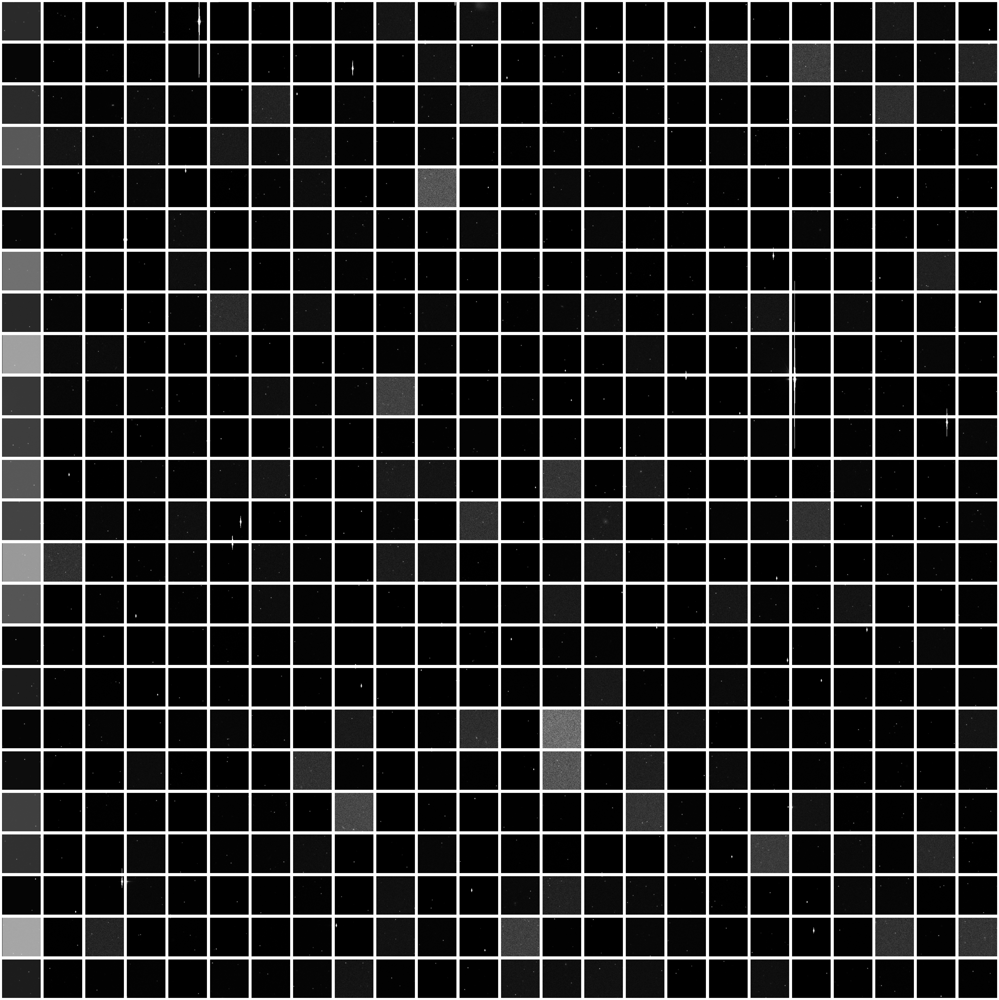

Thumbnails saved successfully.


In [ ]:
image_size = 128
height, width = data.shape[:2]  
thumb_size = 128  # Size of each thumbnail

# Calculate the number of thumbnails in each dimension
num_thumbs_y = height // thumb_size
num_thumbs_x = width // thumb_size

# Create directory for saving images if it does not exist
thumbnails_dir = r'F:\more code\output'  # Directory for all thumbnails
os.makedirs(thumbnails_dir, exist_ok=True)

# Initialize a counter for sequential numbering
counter = 0

# Calculate total number of thumbnails
total_thumbnails = num_thumbs_y * num_thumbs_x

# Initialize an array to hold the thumbnails
thumbnails_array = np.zeros((total_thumbnails, image_size, image_size, 3), dtype=np.uint8)

# Loop through and extract each thumbnail
for i in range(num_thumbs_y):
    for j in range(num_thumbs_x):
        # Calculate the coordinates for the thumbnail extraction
        y_start = i * thumb_size
        y_end = y_start + thumb_size
        x_start = j * thumb_size
        x_end = x_start + thumb_size
        
        # Extract the thumbnail from the data array
        thumbnail = data[y_start:y_end, x_start:x_end]
        
        # Normalize the thumbnail to [0, 1]
        if thumbnail.dtype != np.float32:
            thumbnail_image = (thumbnail - np.min(thumbnail)) / (np.max(thumbnail) - np.min(thumbnail))  # Normalize to [0, 1]
        else:
            thumbnail_image = thumbnail

        # Convert to uint8 for saving
        thumbnail_image = (thumbnail_image * 255).astype(np.uint8)

        
        thumbnail_image = Image.fromarray(thumbnail_image).convert('RGB').resize((image_size, image_size))

        # Save the thumbnail into the array as an RGB image
        thumbnails_array[counter] = np.array(thumbnail_image)

        # Save the image with a sequential filename (optional)
        img_path = os.path.join(thumbnails_dir, f'{counter}.jpg')
        
        
        thumbnail_image.save(img_path)
        
        # Increment the counter for the next thumbnail
        counter += 1

# Show the plot of thumbnails
fig, axes = plt.subplots(num_thumbs_y, num_thumbs_x, figsize=(num_thumbs_x * 2, num_thumbs_y * 2))
for idx in range(total_thumbnails):
    ax = axes[idx // num_thumbs_x, idx % num_thumbs_x]
    ax.imshow(thumbnails_array[idx])
    ax.axis('off')  

plt.tight_layout()
plt.show()

print("Thumbnails saved successfully.")

this part loads all the traning , validation data from its respective directories 

In [ ]:
# Set up logging
logging.basicConfig(level=logging.INFO)

# Directories for training, testing, and validation datasets
train_dir = r"F:\more code\Training"
validation_dir = r'F:\more code\Validation'
output_dir = r'F:\more code\Model'
image_size = 128  

This part the data for training of the model in 128 x 128 pixel shuflled and in 32 batches 

In [5]:

# Data generator for training and validation without augmentation
train_datagen = ImageDataGenerator(rescale=1./255)  # Normalize pixel values to [0, 1]

# Training data generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='input',  
    shuffle=True  # Shuffle the data
)

# Validation data generator
validation_datagen = ImageDataGenerator(rescale=1./255)  # Normalize pixel values to [0, 1]
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='binary'  
)

Found 6000 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


In [20]:
# Check output shapes from generators to debug structure issues
data_batch, labels_batch = next(train_generator)
print(f"Data batch shape: {data_batch.shape}, Labels batch shape: {labels_batch.shape}")
print(f"Data type of images: {data_batch.dtype}, Labels type: {labels_batch.dtype}")


Data batch shape: (32, 128, 128, 3), Labels batch shape: (32, 128, 128, 3)
Data type of images: float32, Labels type: float32


This part loads images from the directory for validation and training

In [ ]:
def load_images_from_directory(directory, image_size):
    images = []
    labels = []
    
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for file in os.listdir(label_dir):
                if file.endswith('.jpg'):
                    img_path = os.path.join(label_dir, file)
                    try:
                        img = Image.open(img_path).resize((image_size, image_size))
                        img = img.convert('RGB')
                        img_array = np.array(img) / 255.0  # Normalize to [0, 1]
                        images.append(img_array)
                        labels.append(1 if label == 'streaked' else 0)  
                    except Exception as e:
                        logging.error(f"Error loading image {img_path}: {e}")
    
    return np.array(images), np.array(labels)

# Load training and validation images
train_images, train_labels = load_images_from_directory(train_dir, image_size)
val_images, val_labels = load_images_from_directory(validation_dir, image_size)

# Create TensorFlow datasets directly from numpy arrays
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_labels))

# Shuffle and batch the datasets
train_dataset = train_dataset.shuffle(buffer_size=len(train_images)).batch(32)
val_dataset = val_dataset.batch(32)

In [ ]:
base_model = EfficientNetB5(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Build the model
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))  # Single Dense layer with 128 units
model.add(BatchNormalization())  # Batch Normalization after the Dense layer
model.add(Dropout(0.5))  # Dropout after the Dense layer
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Show model summary
model.summary()



Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb5 (Functional)     │ (None, 4, 4, 2048)     │    28,513,527 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_11     │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,776,440 (109.77 MB)

 Trainable params: 28,603,441 (109.11 MB)

 Non-trainable params: 172,999 (675.78 KB)

In [24]:
# Calculate class weights if needed to handle imbalanced classes
unique_classes = np.unique(train_generator.classes)
if len(unique_classes) > 1:
    class_weights = class_weight.compute_class_weight(
        class_weight='balanced',
        classes=unique_classes.astype(int),
        y=train_generator.classes
    )
    class_weights_dict = {i: float(class_weights[i]) for i in range(len(unique_classes))}
else:
    class_weights_dict = None

In [25]:
# Train the model
try:
    history = model.fit(
        train_dataset,
        epochs=5,
        validation_data=val_dataset,
        class_weight=class_weights_dict,
        callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
                   ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0010)]
    )
except Exception as e:
    print(f"Error during training: {e}")

Epoch 1/5
188/188 ━━━━━━━━━━━━━━━━━━━━ 859s 4s/step - accuracy: 0.6726 - loss: 0.6891 - val_accuracy: 1.0000 - val_loss: 0.0625 - learning_rate: 0.0010
Epoch 2/5
188/188 ━━━━━━━━━━━━━━━━━━━━ 645s 3s/step - accuracy: 0.9870 - loss: 0.0942 - val_accuracy: 1.0000 - val_loss: 0.0135 - learning_rate: 0.0010
Epoch 3/5
188/188 ━━━━━━━━━━━━━━━━━━━━ 584s 3s/step - accuracy: 0.9981 - loss: 0.0204 - val_accuracy: 1.0000 - val_loss: 0.0055 - learning_rate: 0.0010
Epoch 4/5
188/188 ━━━━━━━━━━━━━━━━━━━━ 585s 3s/step - accuracy: 0.9996 - loss: 0.0087 - val_accuracy: 1.0000 - val_loss: 0.0030 - learning_rate: 0.0010
Epoch 5/5
188/188 ━━━━━━━━━━━━━━━━━━━━ 580s 3s/step - accuracy: 1.0000 - loss: 0.0045 - val_accuracy: 1.0000 - val_loss: 0.0016 - learning_rate: 0.0010


In [26]:
# Save the model
model_save_path = os.path.join(output_dir, 'model.h5')
model.save(model_save_path)
print(f"Model saved to {model_save_path}")

Model saved to F:\more code\Model\model.h5


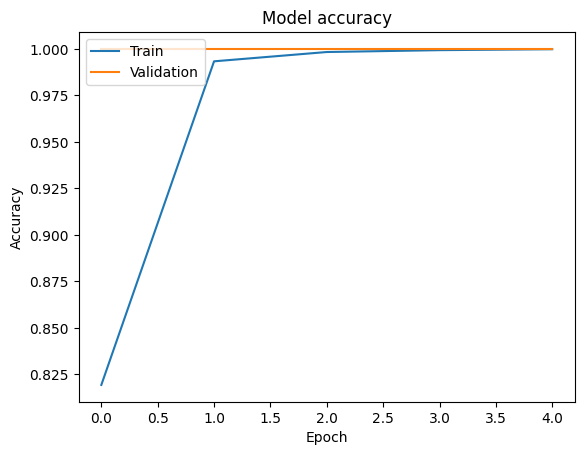

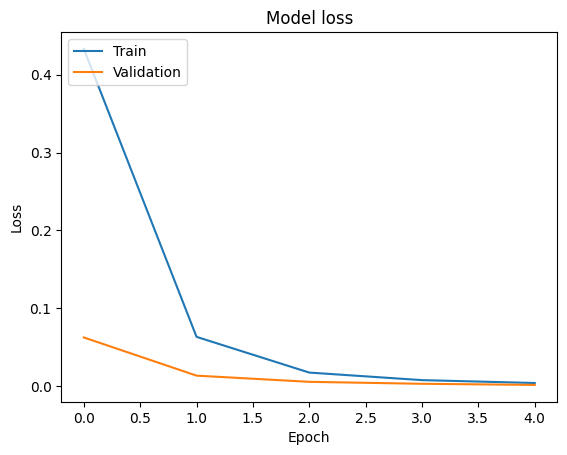

In [27]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [46]:
# Access shapes after loading the data
print(f"Training images shape: {train_generator.n} images, {train_generator.batch_size} batch size")
print(f"Validation images shape: {validation_generator.n} images, {validation_generator.batch_size} batch size")

Training images shape: 6000 images, 32 batch size
Validation images shape: 400 images, 32 batch size


In [ ]:
test_dir = r'F:\more code\Testing2'
# Load and evaluate test images
def load_test_images(test_dir, image_size):
    test_images = []
    test_labels = []
    file_paths = []

    for root, dirs, files in os.walk(test_dir):
        for file in files:
            if file.endswith('.jpg'):
                img_path = os.path.join(root, file)
                try:
                    img = Image.open(img_path).resize((image_size, image_size))
                    img = img.convert('RGB')
                    img_array = np.array(img) / 255.0

                    # Check if the image is blank (full black)
                    if np.sum(img_array) == 0:
                            logging.warning(f"Skipping blank image: {img_path}")
                            continue

                    if img_array.ndim == 3:
                        test_images.append(img_array)
                    else:
                        logging.error(f"Image {img_path} does not have 3 dimensions: {img_array.shape}")
                        continue

                    # Labeling logic
                    if 'streaked_image_' in file:
                        label = 1
                    else:
                        label = 0  

                    test_labels.append(label)
                    file_paths.append(img_path)
                except Exception as e:
                    logging.error(f"Error loading image {img_path}: {e}")

    return np.array(test_images), np.array(test_labels), file_paths

# Load and evaluate test images
test_images, test_labels, file_paths = load_test_images(test_dir, image_size)

# Ensure model exists before evaluation
if 'model' in locals():
    try:
        test_loss, test_accuracy = model.evaluate(test_images, test_labels)
        print(f"Done")
    except Exception as e:
        print(f"Error during evaluation: {e}")
else:
    print("Model not found. Please ensure the model is defined before evaluation.")


8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 566ms/step - accuracy: 0.9608 - loss: 0.5716
Done


In [38]:
# Step 8: Predict using the model
predictions = model.predict(test_images)
predicted_labels = (predictions > 0.5).astype(int)
  
# Calculate true negatives, and false negatives
true_negative = np.sum((predicted_labels == 0) & (test_labels == 0))
false_negative = np.sum((predicted_labels == 0) & (test_labels == 1))

# Print the results
print(f"True Negatives: {true_negative}")
print(f"False Negatives: {false_negative}")


8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 576ms/step
True Negatives: 47940
False Negatives: 7285


In [15]:
# Load EfficientNetB5 as the base model
base_model = EfficientNetB5(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Build the model
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))  # Single Dense layer with 64 units
model.add(BatchNormalization())  # Add Batch Normalization after the Dense layer
model.add(Dropout(0.5))  # Dropout after the Dense layer
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
test_dir= r'F:\more code\Testing'

# Load and evaluate test images
def load_test_images(test_dir, image_size):
    test_images = []
    test_labels = []
    file_paths = []

    for root, dirs, files in os.walk(test_dir):
        for file in files:
            if file.endswith('.jpg'):
                img_path = os.path.join(root, file)
                try:
                    img = Image.open(img_path).resize((image_size, image_size))
                    img = img.convert('RGB')
                    img_array = np.array(img) / 255.0

                    # Check if the image is blank (full black)
                    if np.sum(img_array) == 0:
                            logging.warning(f"Skipping blank image: {img_path}")
                            continue

                    if img_array.ndim == 3:
                        test_images.append(img_array)
                    else:
                        logging.error(f"Image {img_path} does not have 3 dimensions: {img_array.shape}")
                        continue

                    # Labeling logic
                    if 'streaked_image_' in file:
                        label = 1
                    else:
                        label = 0  # Default label for other images

                    test_labels.append(label)
                    file_paths.append(img_path)
                except Exception as e:
                    logging.error(f"Error loading image {img_path}: {e}")

    return np.array(test_images), np.array(test_labels), file_paths

# Load and evaluate test images
test_images, test_labels, file_paths = load_test_images(test_dir, image_size)

# Ensure model exists before evaluation
if 'model' in locals():
    try:
        test_loss, test_accuracy = model.evaluate(test_images, test_labels)
        print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
    except Exception as e:
        print(f"Error during evaluation: {e}")
else:
    print("Model not found. Please ensure the model is defined before evaluation.")


13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 625ms/step - accuracy: 0.7669 - loss: 0.6043
Test Accuracy: 92.00%


In [17]:
# Step 8: Predict using the model
predictions = model.predict(test_images)
predicted_labels = (predictions > 0.5).astype(int)
  
# Calculate true positives, true negatives, false positives, and false negatives
true_positive = np.sum((predicted_labels == 1) & (test_labels == 1))
false_positive = np.sum((predicted_labels == 1) & (test_labels == 0))

# Print the results
print(f"True Positives: {true_positive}")
print(f"False Positives: {false_positive}")


13/13 ━━━━━━━━━━━━━━━━━━━━ 11s 695ms/step
True Positives: 147200
False Positives: 12800


In [37]:
# Step 8: Create a catalog for accuracy
train_accuracy = history.history['accuracy'][-1] * 100
val_accuracy = history.history['val_accuracy'][-1] * 100

print("Accuracy Catalog:")
print(f"Training Accuracy: {train_accuracy:.2f}%")
print(f"Validation Accuracy: {val_accuracy:.2f}%")


Accuracy Catalog:
Training Accuracy: 99.98%
Validation Accuracy: 100.00%


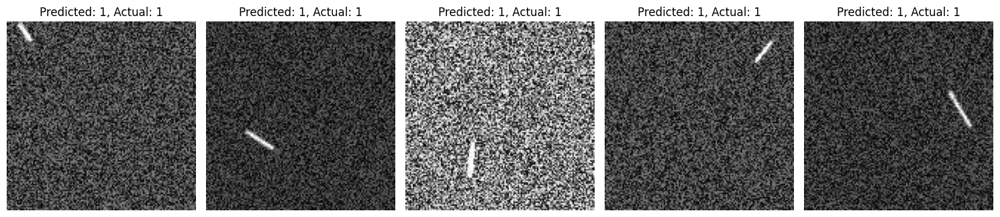

In [25]:
# Step 9: Visualize Results
# Display the first 5 true positive images (predicted = actual = 1)
num_images_to_display = 5
true_positive_count = 0

plt.figure(figsize=(15, 5))
for i in range(len(test_images)):
    # Check if the prediction and label are both positive (true positive)
    if predicted_labels[i][0] > 0.5 and test_labels[i] == 1:
        plt.subplot(1, num_images_to_display, true_positive_count + 1)
        plt.imshow(test_images[i])
        plt.title(f'Predicted: 1, Actual: 1')
        plt.axis('off')
        true_positive_count += 1
        
        # Stop after displaying 5 images
        if true_positive_count == num_images_to_display:
            break

# Show the results
plt.tight_layout()
plt.show()
